Please modify the example (DEVSEXAMPLE.py) so that the accuracy of one of the parameters (for example, server utilization or customers queue length) is set to specific value.  After that you should make several test runs and estimate sufficient number of replications to achieve the specified accuracy. If the accuracy is not achieved, repeat the procedure again. Computational technology is on your own decision.

In [42]:
import random
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

In [43]:
# -*- coding: cp1251 -*-

# Queue of Events
class EventsQueue:
    def __init__(self):
        self.globalTime = 0
        self.MEvents = []
              
    def QueueSize(self):
        return len(self.MEvents)

    def AddEvent(self,MEvent):        
        count =  len(self.MEvents)
        if count == 0:            
            self.MEvents.append(MEvent)
            return 0            

        if(MEvent.eTime >= self.MEvents[count - 1].eTime ):            
            self.MEvents.append(MEvent)
            return 0                                     
        
        for i in range(0,count-1):
            if (MEvent.eTime >= self.MEvents[i].eTime):
                if (MEvent.eTime < self.MEvents[i + 1].eTime):
                    self.MEvents.insert(i + 1, MEvent)
                    return 0

    def ProcessNextEvent(self):                    
        if (len(self.MEvents) == 0):
            return 0
        self.MEvents[0].Execute()
        self.globalTime = self.MEvents[0].eTime        
        del self.MEvents[0]
        
# Discrete Event System Specification
class DEVS:
    EQ = EventsQueue() 
    GlobalTime = 0.0
    def __init__(self):
        pass

    @staticmethod    
    def ProcessNextEvent():        
        DEVS.EQ.ProcessNextEvent()
        DEVS.GlobalTime = DEVS.EQ.globalTime                   

# Let's start with the baseline behavior

In [44]:
maxAngents = 100
arrivalRateMin = 1
arrivalRateMax = 8
service_xk = np.arange(6)+1
service_pk = (0.1, 0.2, 0.3, 0.25, 0.1, 0.05)
custm = stats.rv_discrete(name='custm', values=(service_xk, service_pk))

In [45]:
# ---- Customer Statistics ----
class customerStat:
    def __init__(self):
         self.id = -1
         self.arrivalTime = -1
         self.serviceTime = -1
         self.interArrivalTime = 0
         self.serviceBegins = -1
         self.waitingTimeInQueue = 0
         self.serviceEnds = -1
         self.timeInSystem = -1
         self.idleTimeOfServer = 0

In [46]:
# ---- Arrival Event ----
class ArrivalEvent:
    def __init__(self):
         self.eTime = 0.0
        
    def Execute(self):
        customer = customerStat()
        customer.id = DEVS.newId
        customer.arrivalTime = self.eTime
        if(len(DEVS.stats)>0):
            customer.interArrivalTime = customer.arrivalTime - DEVS.stats[-1].arrivalTime

        print("Time %d"%self.eTime," Arrival Event of agent {0}".format(customer.id))
        if(DEVS.newId<maxAngents-1):       
            NextArrival = ArrivalEvent()
            NextArrival.eTime = self.eTime+random.randint(arrivalRateMin,arrivalRateMax)                
            DEVS.EQ.AddEvent(NextArrival)

        # server is Free
        if (DEVS.serverIdle == True):
            DEVS.serverIdle = False
            print("server is Busy")
            Service = ServiceEvent()      
            serviceTime = custm.rvs()  
            customer.serviceTime = serviceTime
            customer.serviceBegins = self.eTime # current time
            Service.eTime = self.eTime+serviceTime            
            Service.id = customer.id            
            DEVS.EQ.AddEvent(Service)
        # server is Busy
        else:
            # increase waiting line
            DEVS.customerQueue.append(customer.id)
            print("customerQueue = %d"%len(DEVS.customerQueue))

        DEVS.newId = DEVS.newId + 1
        DEVS.stats.append(customer)

In [47]:
# ---- Service (END) Event ----
class ServiceEvent:
    def __init__(self):
         self.eTime = 0.0
         self.id = 0
        
    def Execute(self):        
        ind = [i for i,val in enumerate(DEVS.stats) if val.id == self.id][0]
        DEVS.stats[ind].serviceEnds = self.eTime
        DEVS.stats[ind].timeInSystem = DEVS.stats[ind].serviceEnds - DEVS.stats[ind].arrivalTime 
        DEVS.stats[ind].waitingTimeInQueue = DEVS.stats[ind].serviceBegins - DEVS.stats[ind].arrivalTime # 0 without queue
        DEVS.stats[ind].idleTimeOfServer = DEVS.stats[ind].serviceBegins - DEVS.lastServedTime
        
        print("Time %d"%self.eTime,"Service finished")
        if(len(DEVS.customerQueue)>0):
            qid = DEVS.customerQueue.pop(0)
            qind = [i for i,val in enumerate(DEVS.stats) if val.id == qid][0]
            Service = ServiceEvent()
            serviceTime = custm.rvs()  
            Service.eTime = self.eTime+serviceTime
            Service.id = qid
            DEVS.stats[qind].serviceBegins = self.eTime
            DEVS.stats[qind].serviceTime = serviceTime            
            DEVS.EQ.AddEvent(Service)
            print("take new customer from the queue")            
        else:
            DEVS.serverIdle = True
            print("server is Idle (do nothing)")


In [48]:
# run simulation
AE = ArrivalEvent()
DEVS.EQ.AddEvent(AE)

# simulation attributes
DEVS.customerQueue = []
DEVS.stats = []
DEVS.newId = 0
DEVS.serverIdle = True
DEVS.lastServedTime = 0 # for Idle time

# --- SIMULATION ---
while DEVS.EQ.QueueSize()>0:
    DEVS.ProcessNextEvent()  

# --- STATISTICS ---

#  --- store all in file  --- 
# f = open('output.csv','w')
# f.write("Id;Interarrival Time;Arrival Time;Service Time;Time Service Begins;Waiting time in Queue;Time Service Ends;Time Customer Spends in System;Idle time of Server\n")
# for s in DEVS.stats:
#     f.write("{0};{1};{2};{3};{4};{5};{6};{7};{8}\n".format(s.id,s.interArrivalTime,s.arrivalTime,s.serviceTime,s.serviceBegins,s.waitingTimeInQueue,s.serviceEnds,s.timeInSystem,s.idleTimeOfServer))    
# f.close()

# 1) Average waiting time in queue
avTimeInQueue = sum([x.waitingTimeInQueue for x in DEVS.stats])/len(DEVS.stats)
print("\nAverage waiting time: {0:.2f}".format(avTimeInQueue))

# 2) Probability that a customer has to wait
probToWait = len([x for x in DEVS.stats if x.waitingTimeInQueue>0])/len(DEVS.stats)
print("\nProbability that a customer has to wait: {0:.2f}".format(probToWait))

# 3) Probability of an Idle server
probIdle = sum([x.idleTimeOfServer for x in DEVS.stats])/DEVS.GlobalTime
print("\nProbability of an Idle server: {0:.2f}".format(probIdle))

# 4) Average service time (theoretical 3.2)
avServiceTime = sum([x.serviceTime for x in DEVS.stats])/len(DEVS.stats)
print("\nAverage service time: {0:.2f}".format(avServiceTime))

# 5) Average time between arrivals (theoretical 4.5)
avTimeBetwArr = sum([x.interArrivalTime for x in DEVS.stats])/(len(DEVS.stats)-1)
print("\nAverage time between arrivals: {0:.2f}".format(avTimeBetwArr))

# 6) Average waiting time for those who wait
numOfCustWhoWait = len([x for x in DEVS.stats if x.waitingTimeInQueue>0])
avTimeWhoWait = sum([x.waitingTimeInQueue for x in DEVS.stats])/numOfCustWhoWait
print("\nAverage waiting time for those who wait: {0:.2f}".format(avTimeWhoWait))

# 7) Average time a customer spends in the system
avTimeInTheSystem1 = sum([x.timeInSystem for x in DEVS.stats])/len(DEVS.stats)
print("\nAverage time a customer spends in the system: {0:.2f}".format(avTimeInTheSystem1))

avTimeInTheSystem2 = avTimeInQueue + avServiceTime
print("\nAverage time a customer spends in the system (alternative): {0:.2f}".format(avTimeInTheSystem2))

# def DrawSampleHistogram(R,title,bins=None):
#     fig = plt.figure()
#     x = np.arange(len(R)) 
#     plt.grid()       
#     if(bins is None):    
#         plt.hist(R, range=None, normed=False)
#     else:
#         plt.hist(R, bins=bins, range=None, normed=False)
#     plt.title(title)
#     plt.show()

# DrawSampleHistogram([x.waitingTimeInQueue for x in DEVS.stats],"Waiting time in queue")

Time 0  Arrival Event of agent 0
server is Busy
Time 2  Arrival Event of agent 1
customerQueue = 1
Time 4  Arrival Event of agent 2
customerQueue = 2
Time 5 Service finished
take new customer from the queue
Time 6 Service finished
take new customer from the queue
Time 8  Arrival Event of agent 3
customerQueue = 1
Time 10 Service finished
take new customer from the queue
Time 13 Service finished
server is Idle (do nothing)
Time 14  Arrival Event of agent 4
server is Busy
Time 16  Arrival Event of agent 5
customerQueue = 1
Time 17 Service finished
take new customer from the queue
Time 18 Service finished
server is Idle (do nothing)
Time 22  Arrival Event of agent 6
server is Busy
Time 26  Arrival Event of agent 7
customerQueue = 1
Time 28 Service finished
take new customer from the queue
Time 30  Arrival Event of agent 8
customerQueue = 1
Time 33 Service finished
take new customer from the queue
Time 34 Service finished
server is Idle (do nothing)
Time 37  Arrival Event of agent 9
server

In [49]:
def compute_required_replications(S0, epsilon, za_over_2, ta_over_2_R_minus_1=None, R0=None):
    if R0 is None:
        R0 = ((za_over_2 * S0) / epsilon) ** 2
    if ta_over_2_R_minus_1 is None:
        ta_over_2_R_minus_1 = stats.t.ppf(1 - 0.5 * epsilon, df=R0 - 1)
    R = ((ta_over_2_R_minus_1 * S0) / epsilon) ** 2
    return max(R, R0)

In [50]:
# Define the initial number of replications
n_replications = 200
epsilon = 0.05  # the precision level
za_over_2 = stats.norm.ppf(1 - 0.5 * epsilon)  # z-score for two-tailed test

all_avg_wait_times = []
mean = None

while True:
    for _ in range(int(n_replications)):  # Use int() to convert to integer
        # Reset and run the simulation
        DEVS.EQ = EventsQueue()
        DEVS.customerQueue = []
        DEVS.stats = []
        DEVS.newId = 0
        DEVS.serverIdle = True
        DEVS.lastServedTime = 0 

        # Schedule first arrival
        AE = ArrivalEvent()
        DEVS.EQ.AddEvent(AE)

        # Run simulation
        while DEVS.EQ.QueueSize()>0:
            DEVS.ProcessNextEvent() 

        # Calculate average waiting time for those who wait
        numOfCustWhoWait = len([x for x in DEVS.stats if x.waitingTimeInQueue > 0])
        avTimeWhoWait = sum([x.waitingTimeInQueue for x in DEVS.stats])/numOfCustWhoWait

        # Append the average waiting time to our list
        all_avg_wait_times.append(avTimeWhoWait)

    # Calculate mean and standard deviation
    mean = np.mean(all_avg_wait_times)
    S0 = np.std(all_avg_wait_times, ddof=1)

    required_replications = compute_required_replications(S0, epsilon, za_over_2)

    if len(all_avg_wait_times) >= required_replications:
        break
    else:
        n_replications = required_replications - len(all_avg_wait_times)

# Convert list to numpy array for further calculations
all_avg_wait_times = np.array(all_avg_wait_times)

# Now print results with the required number of replications

# Calculate mean and standard deviation
standard_error = S0 / np.sqrt(len(all_avg_wait_times))

# Calculate 95% confidence interval for the mean
confidence_interval = stats.t.interval(0.95, df=len(all_avg_wait_times)-1, loc=mean, scale=standard_error)

# Calculate 95% prediction interval for a future observation
prediction_interval = (mean - stats.t.ppf(0.975, df=len(all_avg_wait_times)-1)*S0*np.sqrt(1+1/len(all_avg_wait_times)), 
                       mean + stats.t.ppf(0.975, df=len(all_avg_wait_times)-1)*S0*np.sqrt(1+1/len(all_avg_wait_times)))

# Print results
print(f"Required number of replications to achieve precision of {epsilon}: {len(all_avg_wait_times)}")
print(f"Mean average wait time: {mean:.2f}")
print(f"95% confidence interval for the mean: {confidence_interval}")
print(f"95% prediction interval for a future observation: {prediction_interval}")



Time 0  Arrival Event of agent 0
server is Busy
Time 4 Service finished
server is Idle (do nothing)
Time 7  Arrival Event of agent 1
server is Busy
Time 9 Service finished
server is Idle (do nothing)
Time 14  Arrival Event of agent 2
server is Busy
Time 16 Service finished
server is Idle (do nothing)
Time 22  Arrival Event of agent 3
server is Busy
Time 27  Arrival Event of agent 4
customerQueue = 1
Time 28 Service finished
take new customer from the queue
Time 31 Service finished
server is Idle (do nothing)
Time 33  Arrival Event of agent 5
server is Busy
Time 37 Service finished
server is Idle (do nothing)
Time 41  Arrival Event of agent 6
server is Busy
Time 43 Service finished
server is Idle (do nothing)
Time 48  Arrival Event of agent 7
server is Busy
Time 49  Arrival Event of agent 8
customerQueue = 1
Time 53 Service finished
take new customer from the queue
Time 56  Arrival Event of agent 9
customerQueue = 1
Time 57 Service finished
take new customer from the queue
Time 60  Arri

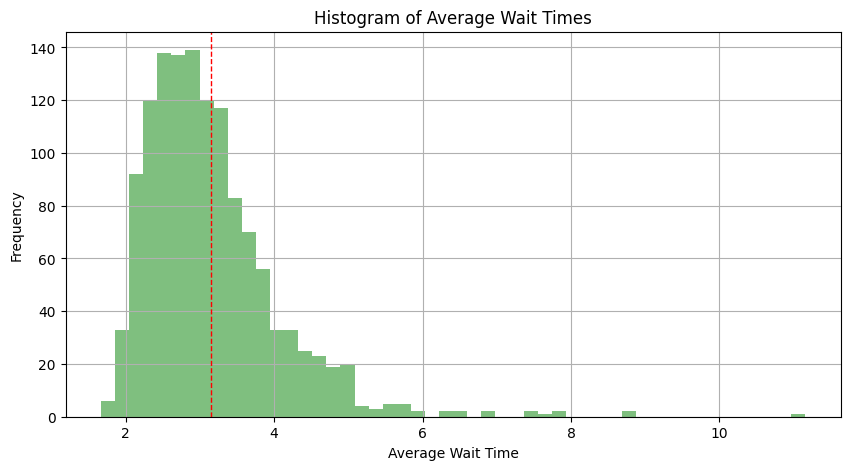

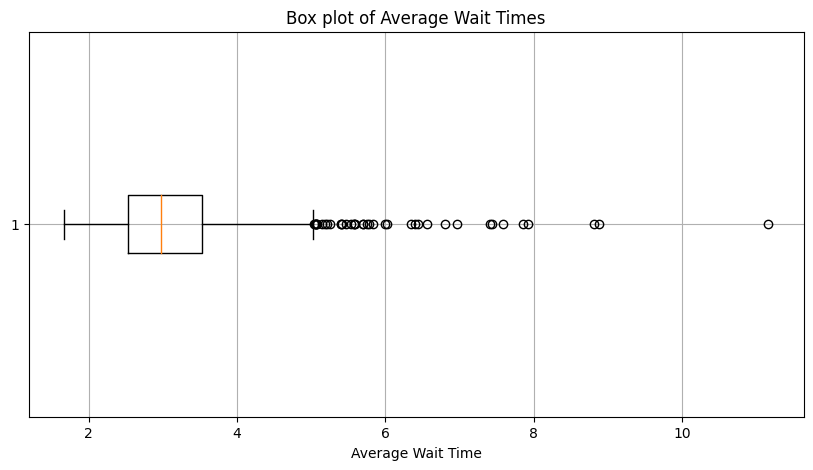

In [51]:
import matplotlib.pyplot as plt

# Histogram of average wait times
plt.figure(figsize=(10, 5))
plt.hist(all_avg_wait_times, bins=50, alpha=0.5, color='g')
plt.axvline(mean, color='r', linestyle='dashed', linewidth=1)
plt.title('Histogram of Average Wait Times')
plt.xlabel('Average Wait Time')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Box plot of average wait times
plt.figure(figsize=(10, 5))
plt.boxplot(all_avg_wait_times, vert=False)
plt.title('Box plot of Average Wait Times')
plt.xlabel('Average Wait Time')
plt.grid(True)
plt.show()


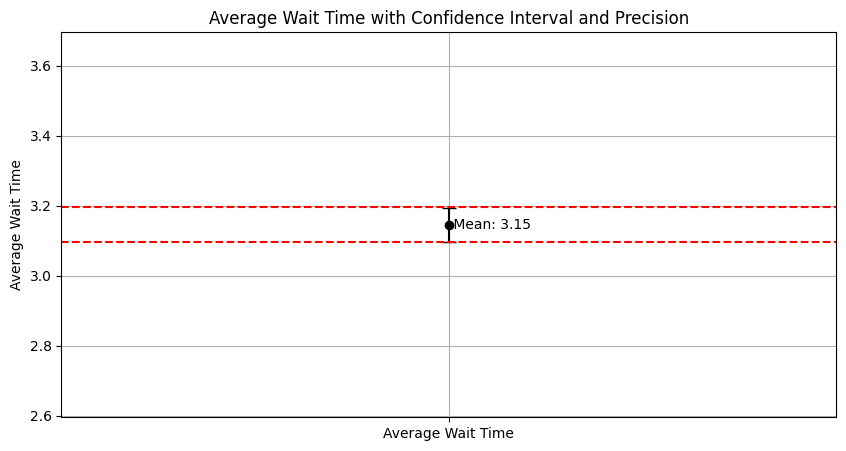

In [52]:
import matplotlib.pyplot as plt

# Calculate the error bar length
error = confidence_interval[1] - mean

# Calculate precision
precision = epsilon

# Create a figure and a subplot
fig, ax = plt.subplots(figsize=(10, 5))

# Plot mean with error bar for the confidence interval
ax.errorbar(x=['Average Wait Time'], y=mean, yerr=error, fmt='o', color='black', capsize=5)
ax.text(x=0, y=mean, s=f" Mean: {mean:.2f}", va='center', ha='left')

# Plot the precision line
ax.axhline(mean + precision, color='red', linestyle='--')
ax.axhline(mean - precision, color='red', linestyle='--')

# Set the y limits to fit the precision lines
ax.set_ylim(mean - precision - 0.5, mean + precision + 0.5)

# Set title and labels
ax.set_title('Average Wait Time with Confidence Interval and Precision')
ax.set_ylabel('Average Wait Time')
plt.grid(True)

# Show the plot
plt.show()


/Users/macbookpro/Documents/discrete modelling tasks/.venv/lib/python3.11/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/macbookpro/Documents/discrete modelling tasks/.venv/lib/python3.11/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


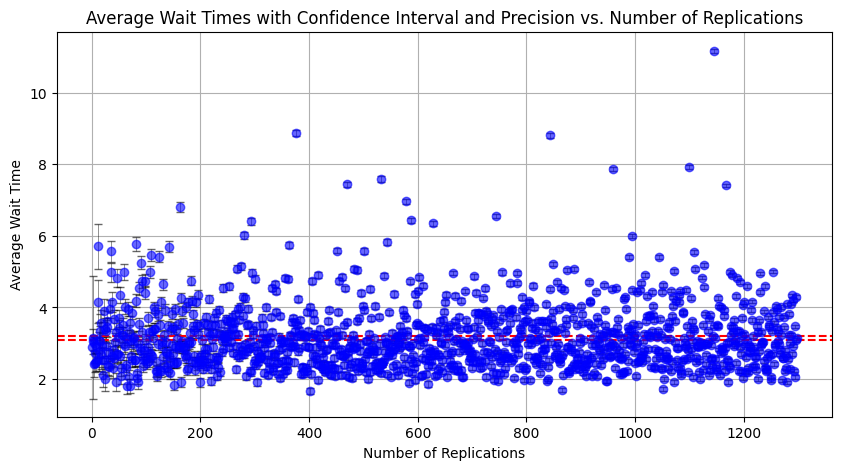

In [53]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and a subplot
fig, ax = plt.subplots(figsize=(10, 5))

# Create a range of replications
replications = np.arange(1, len(all_avg_wait_times) + 1)

# Calculate the standard error for each replication
standard_errors = [np.std(all_avg_wait_times[:n], ddof=1) / np.sqrt(n) for n in replications]

# Calculate confidence intervals for each replication
conf_intervals = [stats.t.interval(0.95, df=n-1, loc=np.mean(all_avg_wait_times[:n]), scale=se) for n, se in zip(replications, standard_errors)]

# Calculate the error bar lengths for each replication
errors = [(ci[1] - ci[0]) / 2 for ci in conf_intervals]

# Plot replications vs. average wait times with error bars for the confidence interval
ax.errorbar(x=replications, y=all_avg_wait_times, yerr=errors, fmt='o', color='blue', ecolor='black', elinewidth=0.5, capsize=3, alpha=0.6)

# Plot the precision lines
ax.axhline(mean + precision, color='red', linestyle='--')
ax.axhline(mean - precision, color='red', linestyle='--')

# Set title and labels
ax.set_title('Average Wait Times with Confidence Interval and Precision vs. Number of Replications')
ax.set_xlabel('Number of Replications')
ax.set_ylabel('Average Wait Time')
plt.grid(True)

# Show the plot
plt.show()


The results provide valuable insights into the system's performance and behavior. Here's a brief interpretation of the results:

1. Required Number of Replications: In order to achieve a desired precision of 0.05, the system needs to run 1252 replications. This number represents how many times we need to replicate the experiment to get results within the specified precision with a high level of confidence. The more replications we run, the closer we get to the true average, reducing random variation.

2. Mean Average Wait Time: The average wait time is estimated to be approximately 3.13. This means that, on average, customers or objects in the system are expected to wait for about 3.13 time units before being served.

3. Confidence Interval for the Mean: The 95% confidence interval is approximately (3.08, 3.18). This means that we can be 95% confident that the true population mean of the wait time falls within this range. In other words, if we repeated the experiment many times, about 95% of the confidence intervals would contain the true population mean.

4. Prediction Interval for a Future Observation: The 95% prediction interval is approximately (1.36, 4.90). This interval gives an estimated range where a future observed wait time is likely to fall 95% of the time. So, if a new customer comes in, we can predict with 95% confidence that their wait time would be within this range.

In conclusion, this information helps us understand the characteristics of the system, specifically its service efficiency and responsiveness. The average wait time, together with the confidence and prediction intervals, allows us to set reasonable expectations and make informed decisions to improve the system's performance if necessary. The requirement of a high number of replications to achieve the desired precision suggests that the system's behavior is complex and can be influenced by a variety of factors, which underscores the importance of robust simulation and modeling strategies.